<a href="https://colab.research.google.com/github/bunkorner/VR_Assignment1/blob/main/Assignment_1b.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
img1 = cv2.imread('gdrive/My Drive/CV/ShadowRemoval1.jpg')

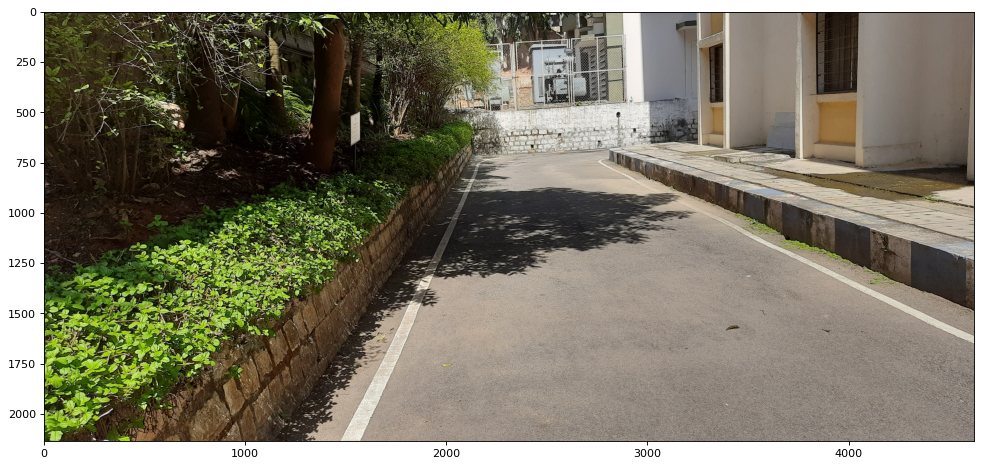

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))

In [ ]:
y_cb_cr_img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2YCrCb)

Converting BGR to YCrCb colour-space to seperate colors from intensity

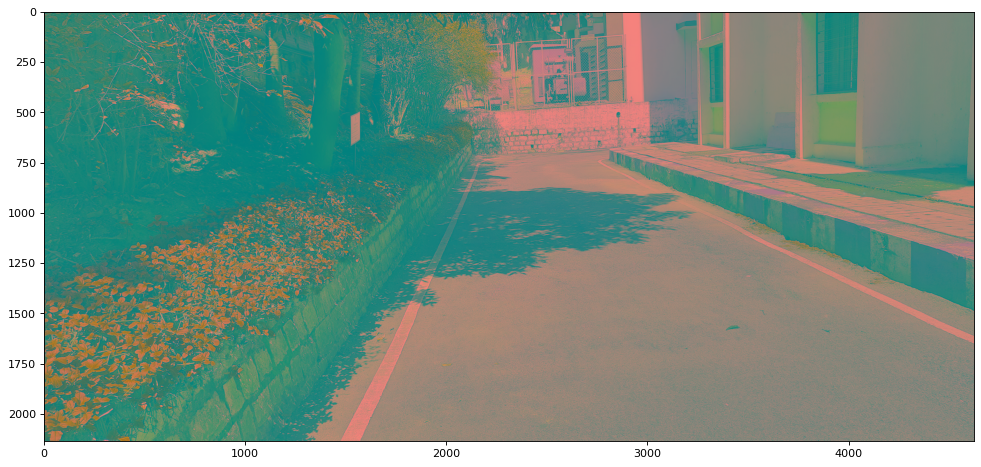

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(y_cb_cr_img1)

In [ ]:
binary_mask1 = np.copy(y_cb_cr_img1)

In [ ]:
y_mean = np.mean(cv2.split(y_cb_cr_img1)[0])
y_std = np.std(cv2.split(y_cb_cr_img1)[0])

Splitting channels of YCrCb and calculating the mean and standard deviation of Y channel

In [ ]:
for i in range(y_cb_cr_img1.shape[0]):
    for j in range(y_cb_cr_img1.shape[1]):

        if y_cb_cr_img1[i, j, 0] < y_mean - (y_std / 3):
            binary_mask1[i, j] = [255, 255, 255]
        else:
            binary_mask1[i, j] = [0, 0, 0]

Getting binary mask of shadowed region:

For every pixel we will check,

if(Y ≤ (mean (Y) – standard deviation (Y)/3)): It is a shadow pixel, else: It is not a shadow pixel

Reference: https://ijcsi.org/papers/IJCSI-10-4-2-270-273.pdf

In [ ]:
binary_mask1 = cv2.cvtColor(binary_mask1, cv2.COLOR_BGR2GRAY)

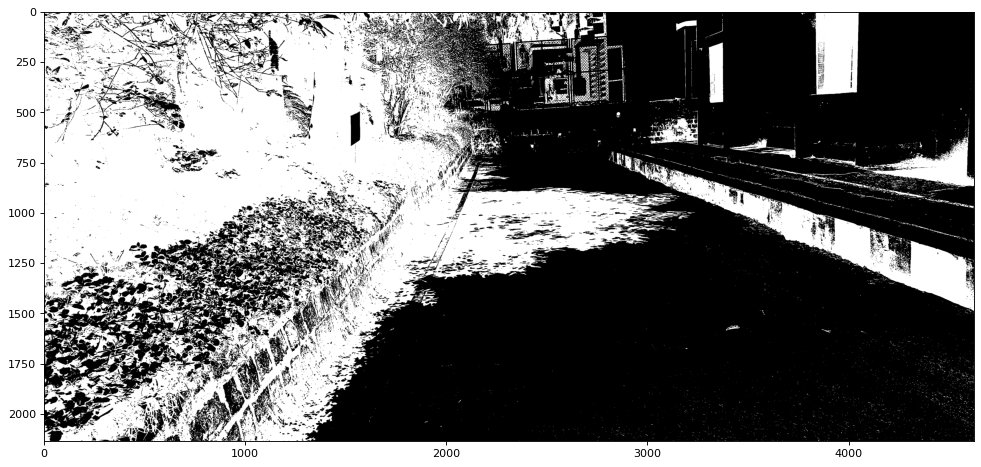

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(binary_mask1, cmap="gray")

We got detected-shadow in form of mask, which we can now use to remove shadow

In [ ]:
h = img1.shape[0]
w = img1.shape[1]

In [ ]:
roi = [
    (1100, h),
    (2400, 300),
    (w, h)
]

Defining Region of Interest

In [ ]:
mask = np.zeros_like(binary_mask1)
cc = img1.shape[2]
mmc = (255,) * cc
cv2.fillPoly(mask, np.array([roi], np.int32), mmc)

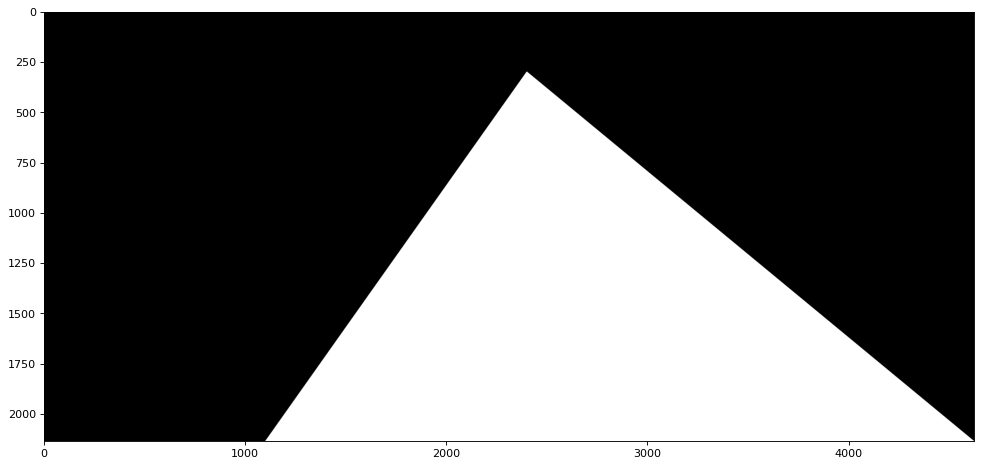

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(mask, cmap="gray")

In [ ]:
masked = cv2.bitwise_and(binary_mask1, mask)

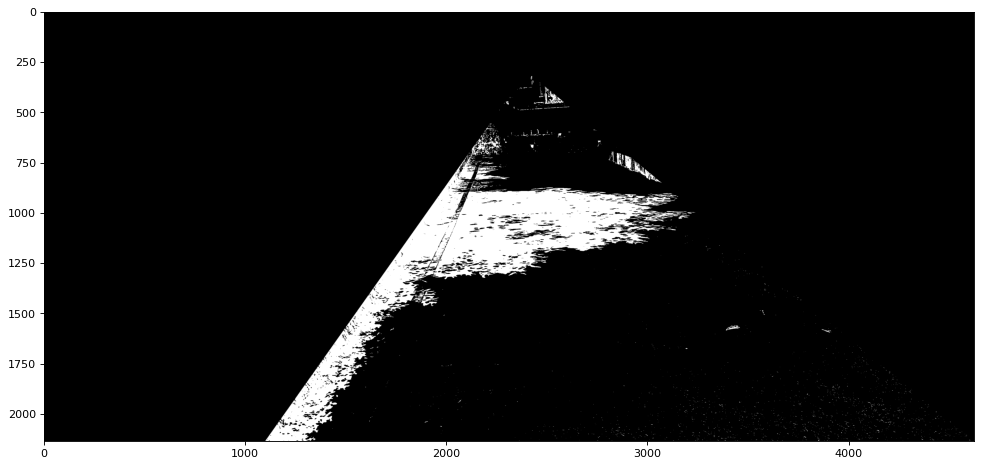

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(masked, cmap="gray")

In [ ]:
output1 = cv2.inpaint(img1, masked, 5, cv2.INPAINT_TELEA)
output2 = cv2.inpaint(img1, masked, 5, cv2.INPAINT_NS)

Using inpaint function to remove shadow

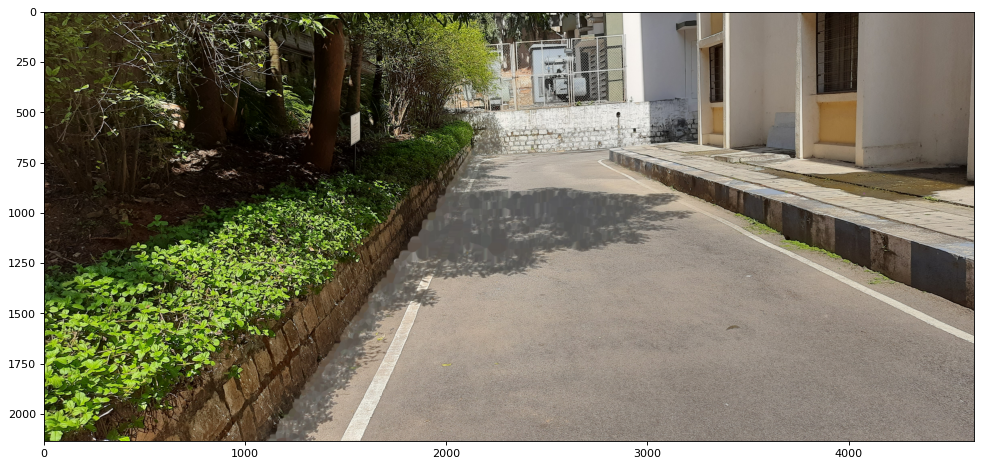

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(cv2.cvtColor(output2, cv2.COLOR_BGR2RGB))

As you can see, the results are not so appealing, so we will use some technique to improve this result

In [ ]:
lab = cv2.cvtColor(output2, cv2.COLOR_BGR2LAB)

Converting this inpainted result to LAB color-space

In [ ]:
l, a, b = cv2.split(lab)

In [ ]:
for i in range(img1.shape[0]):
    for j in range(img1.shape[1]):

        if binary_mask1[i, j] != 0:
            l[i, j]+=60

Increasing L factor of Region of Intrest, to make it more lighter

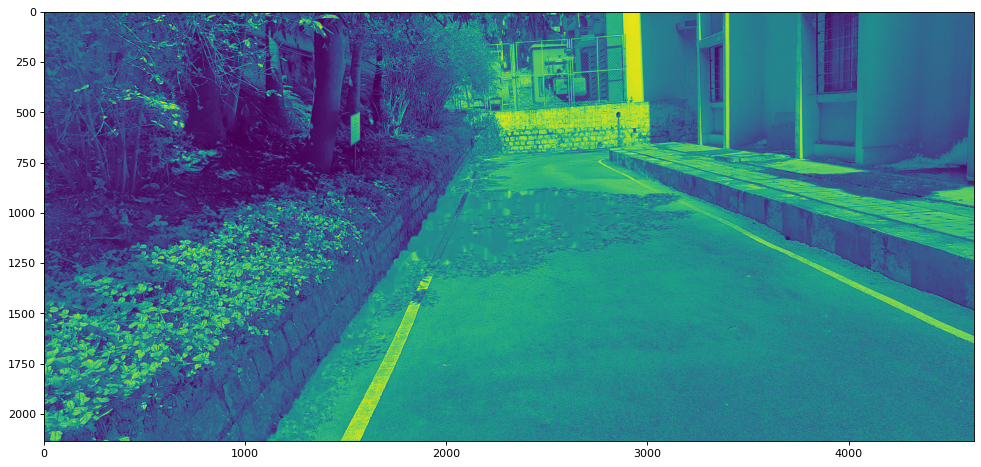

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(l)

In [ ]:
lab2 = cv2.merge([l, a, b])

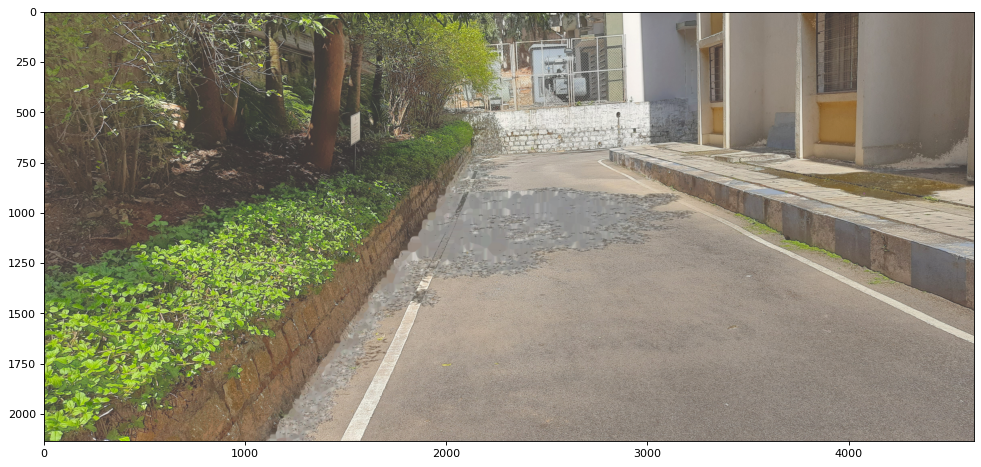

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(cv2.cvtColor(lab2, cv2.COLOR_LAB2RGB))

As you can see, the results have improved from inpainted output.

In [ ]:
img2 = cv2.imread('gdrive/My Drive/CV/ShadowRemoval2.jpg')

Trying the same method for Image two

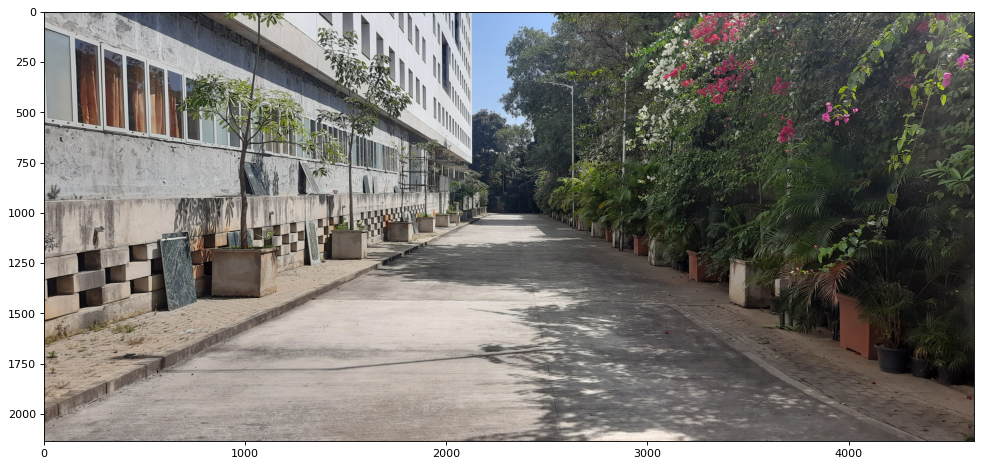

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))

In [ ]:
y_cb_cr_img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2YCrCb)

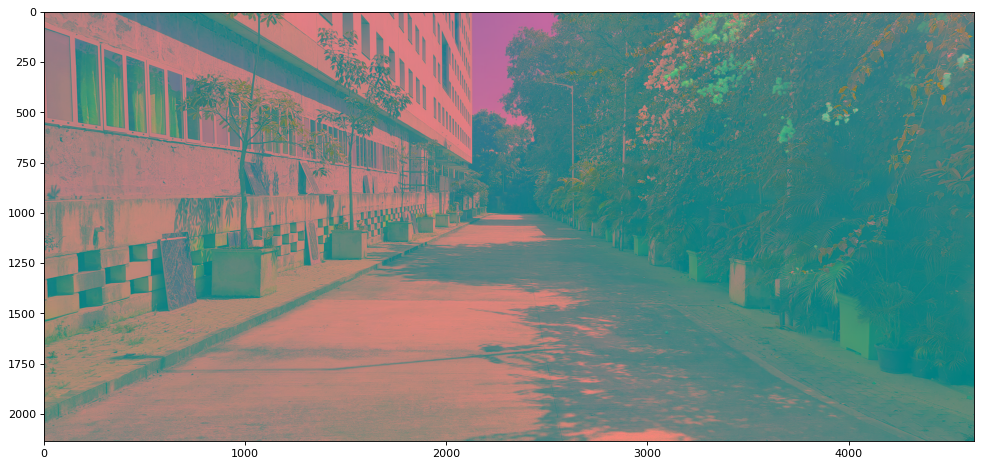

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(y_cb_cr_img2)

In [ ]:
binary_mask2 = np.copy(y_cb_cr_img2)

In [ ]:
y_mean1 = np.mean(cv2.split(y_cb_cr_img2)[0])
y_std1 = np.std(cv2.split(y_cb_cr_img2)[0])

In [ ]:
for i in range(y_cb_cr_img2.shape[0]):
    for j in range(y_cb_cr_img2.shape[1]):

        if y_cb_cr_img2[i, j, 0] < y_mean1 - (y_std1 / 3):
            binary_mask2[i, j] = [255, 255, 255]
        else:
            binary_mask2[i, j] = [0, 0, 0]

In [ ]:
binary_mask2 = cv2.cvtColor(binary_mask2, cv2.COLOR_BGR2GRAY)

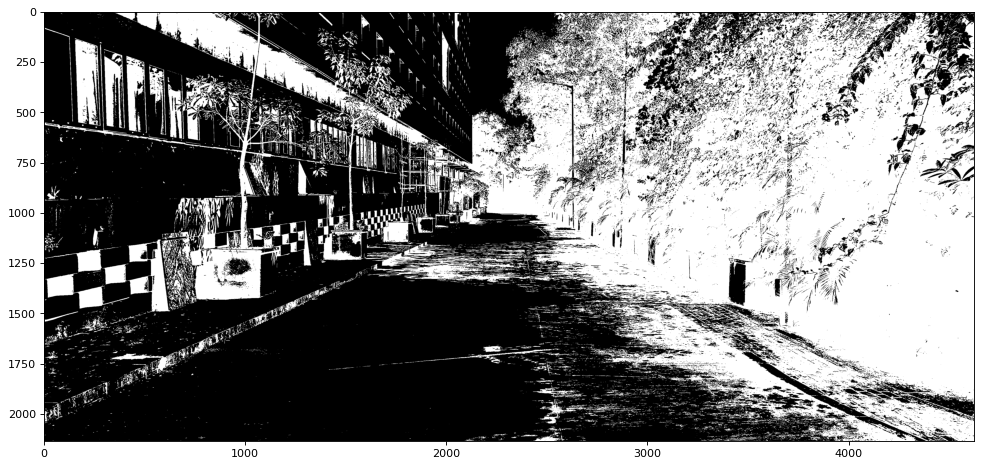

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(binary_mask2, cmap="gray")

Got the mask..

In [ ]:
kernel = np.ones((3, 3), np.uint8)
dilate = cv2.dilate(binary_mask2, kernel, iterations=1)

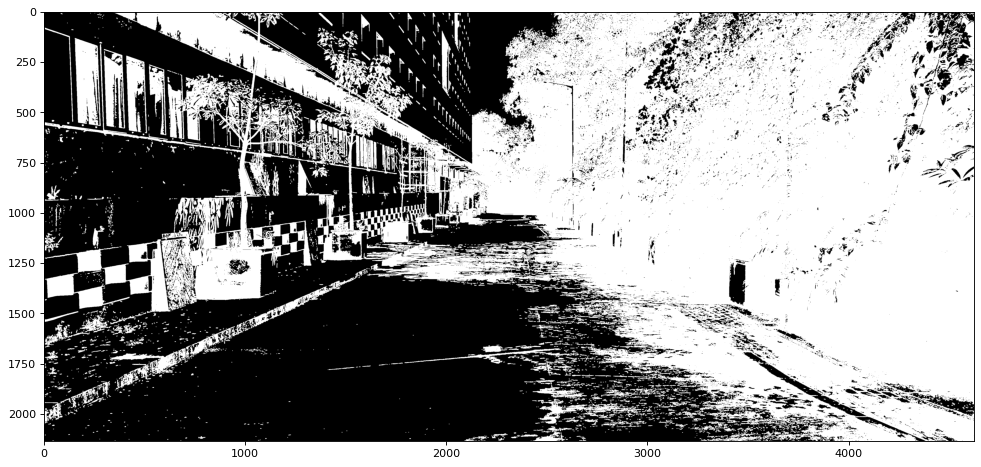

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(dilate, cmap="gray")

In [ ]:
h = img1.shape[0]
w = img1.shape[1]

In [ ]:
roi = [
    (0, h),
    (2400, 750),
    (4100, h)
]

Defined the region of interest

In [ ]:
mask1 = np.zeros_like(dilate)
cc1 = img2.shape[2]
mmc1 = (255,) * cc1
cv2.fillPoly(mask1, np.array([roi], np.int32), mmc1)

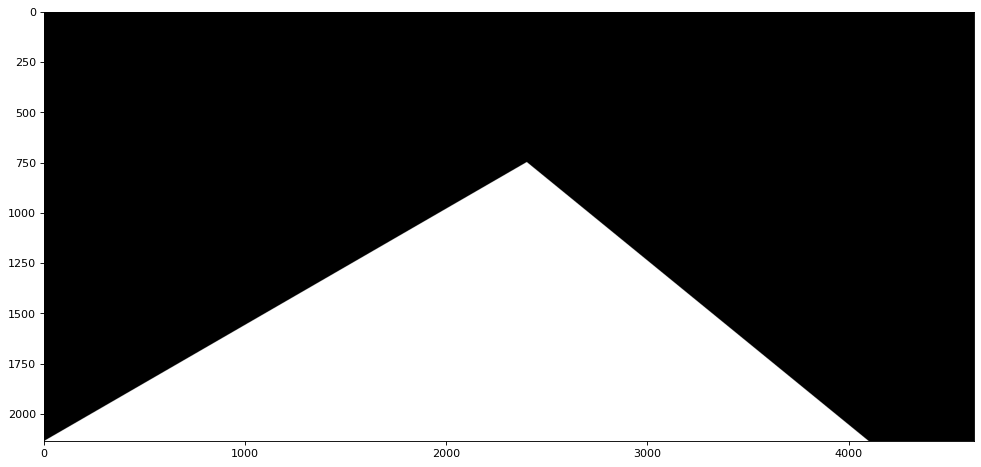

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(mask1, cmap="gray")

In [ ]:
masked1 = cv2.bitwise_and(dilate, mask1)

In [ ]:
masked1[:1000, :]=0

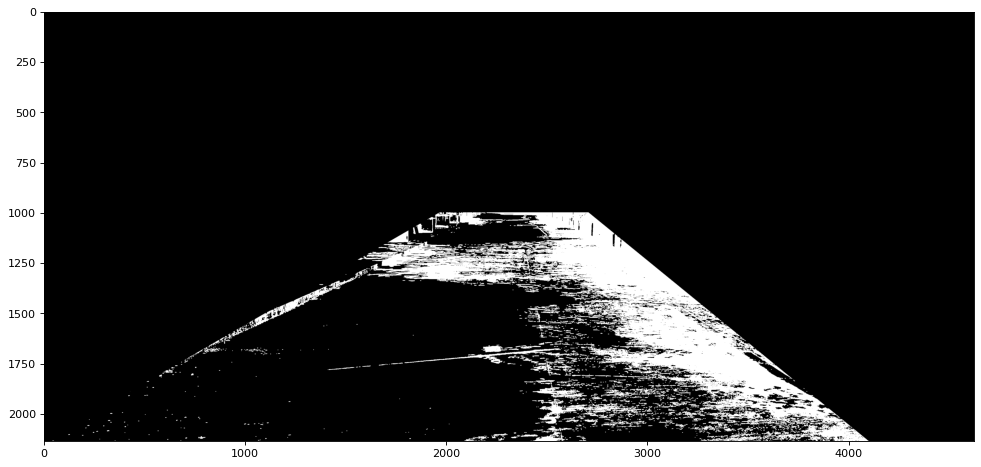

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(masked1, cmap="gray")

In [ ]:
output11 = cv2.inpaint(img2, masked1, 5, cv2.INPAINT_TELEA)
output21 = cv2.inpaint(img2, masked1, 5, cv2.INPAINT_NS)

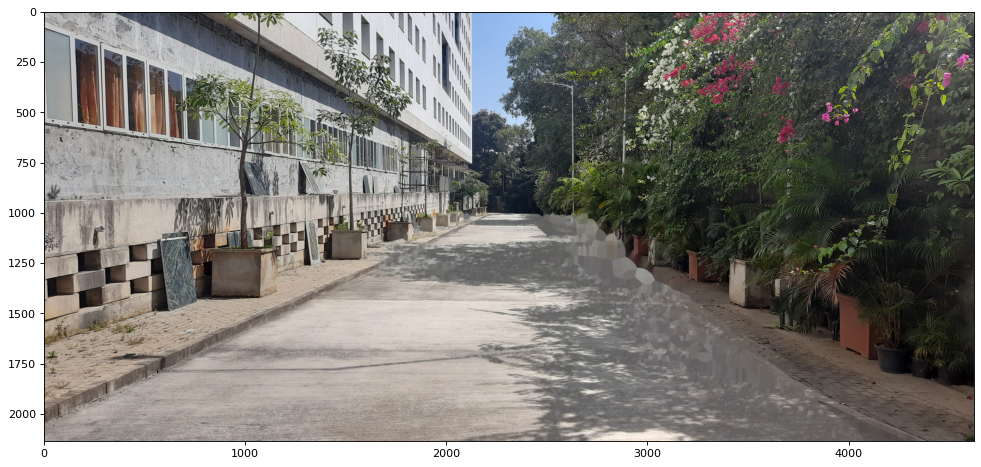

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(cv2.cvtColor(output21, cv2.COLOR_BGR2RGB))

Output of inpaint function on region of interest as Mask

In [ ]:
lab1 = cv2.cvtColor(output21, cv2.COLOR_BGR2LAB)

In [ ]:
l1, a1, b1 = cv2.split(lab1)

In [ ]:
for i in range(img2.shape[0]):
    for j in range(img2.shape[1]):

        if masked1[i, j] != 0:
            l1[i, j]+=60

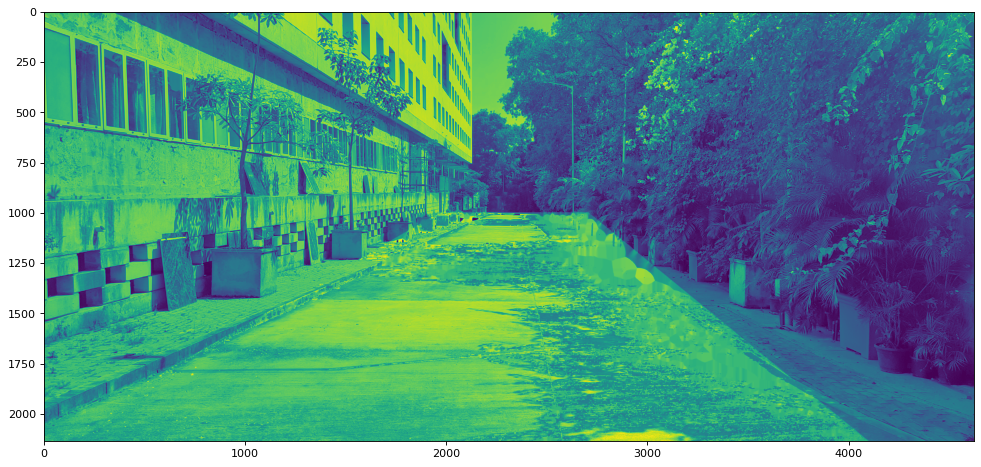

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(l1)

In [ ]:
lab21 = cv2.merge([l1, a1, b1])

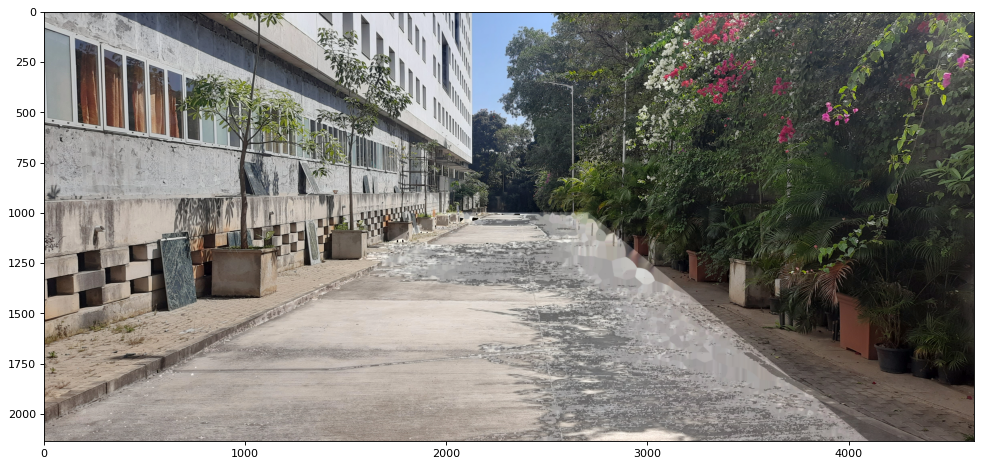

In [ ]:
plt.figure(figsize=(15, 10), dpi=80)
plt.imshow(cv2.cvtColor(lab21, cv2.COLOR_LAB2RGB))

Final Output, It is not at all as it was meant to be, but the type of shadows in both the images (Img1 and Img2) is different.

The shadow in Img1 was dark and was clearly detected as seen in mask1

But the shadow of Img2 was not clearly detected and hence can not remove the shadow properly